In [2]:
PROMPT="A colorful butterfly in an amazonian jungle. particles, ultra details, decorations, fujifilm fuji, kodak gold, cinestill 800t, kodak portra, 8k, UHD, dslr, f10"

In [3]:
from generators.sdxl_generator import SDXLGenerator
from generators.sana_generator import SanaGenerator
from generators.flux_generator import FluxGenerator

from grid_settings.grid_inference_settings import GridInferenceSettings

from lora.lora_config import LoraConfig

import random
import torch

/opt/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
import os

if "HF_HOME" not in os.environ:
    print("WARNING: HF_HOME environment variable is not set!")

In [6]:
#loras=[
#    LoraConfig(lora_path="huggingface/lora/SurrealPsychedelic_bloodbath_surreality_d3ta1led/4.0.safetensors", weights_file=None, triggerword="surreality", name="surrealitypsychedelic", weight=1.1),
#    LoraConfig(lora_path="huggingface/lora/ChineseInkPainting_QIEMANCN/landscape-painting-sdxl_v2.safetensors", weights_file=None, triggerword="QIEMANCN", name="chinesepainting", weight=1.0),
#    LoraConfig(lora_path="huggingface/lora/ColorSwirl_ral-colorswirl/ral-colorswirl-sdxl.safetensors", weights_file=None, triggerword="ral-colorswirl", name="colorswirl", weight=1.0)
#]

grid_inference_example = GridInferenceSettings(prompt=PROMPT,
                                               guidance_scale=[3.0, 12.0],
                                               num_inference_steps=[20],
                                               height=768,
                                               width=512,
                                               num_images_per_prompt=1,
                                               generator=[torch.Generator("cpu").manual_seed(random.randint(0, 100000)) for _ in range(1)]
                                               )

In [ ]:
sdxl_gen = SDXLGenerator(model_path="stabilityai/stable-diffusion-xl-base-1.0", use_refiner=True, refiner_frac=0.95, use_pag=True)
sdxl_outputs = sdxl_gen.grid_inference(grid_inference_example)

# If LORAs
# sdxl_gen = SDXLGenerator(model_path="stabilityai/stable-diffusion-xl-base-1.0", loras=loras, use_refiner=True, refiner_frac=0.95, use_pag=True)
# sdxl_outputs = sdxl_gen.grid_inference(grid_inference_example)

In [ ]:
sana_gen = SanaGenerator(model_path="Efficient-Large-Model/Sana_1600M_512px_diffusers", use_pag=True)
sana_outputs = sana_gen.grid_inference(grid_inference_example)

In [ ]:
# Requires quite a lot of VRAM, 16GB is not enough. Takes 35GB if not offloaded, and offloading takes a lot of time >.<

flux_gen = FluxGenerator(model_path="black-forest-labs/FLUX.1-schnell", torch_dtype=torch.bfloat16)
flux_outputs = flux_gen.grid_inference(grid_inference_example)

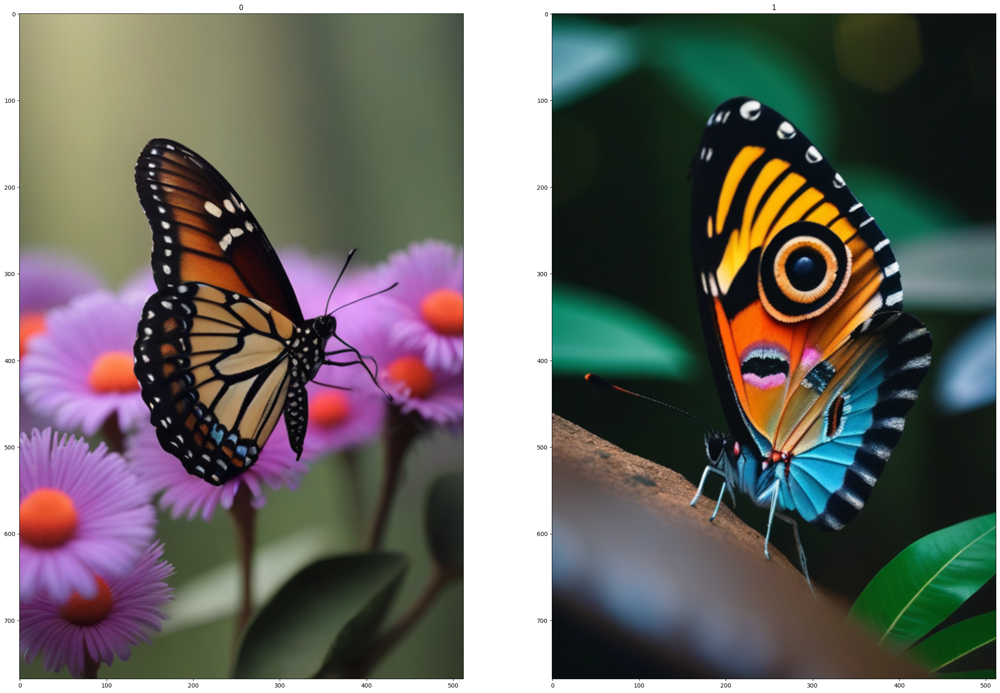

In [11]:
sdxl_gen.show_images(sdxl_gen.get_images_from_pipe_output(sdxl_outputs), 10)

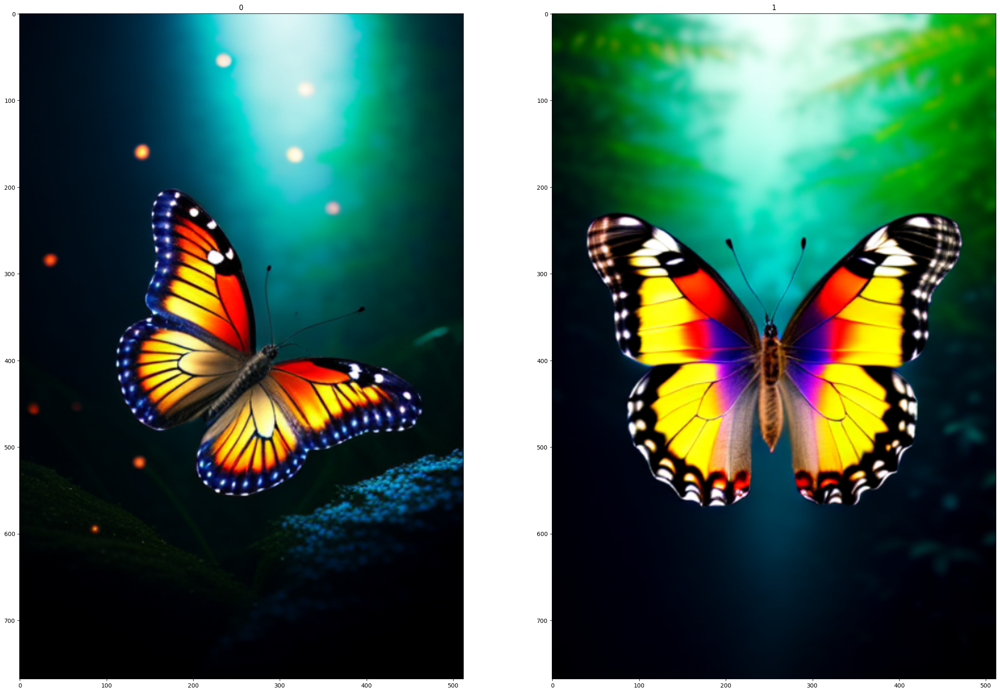

In [12]:
sana_gen.show_images(sana_gen.get_images_from_pipe_output(sana_outputs), 10)

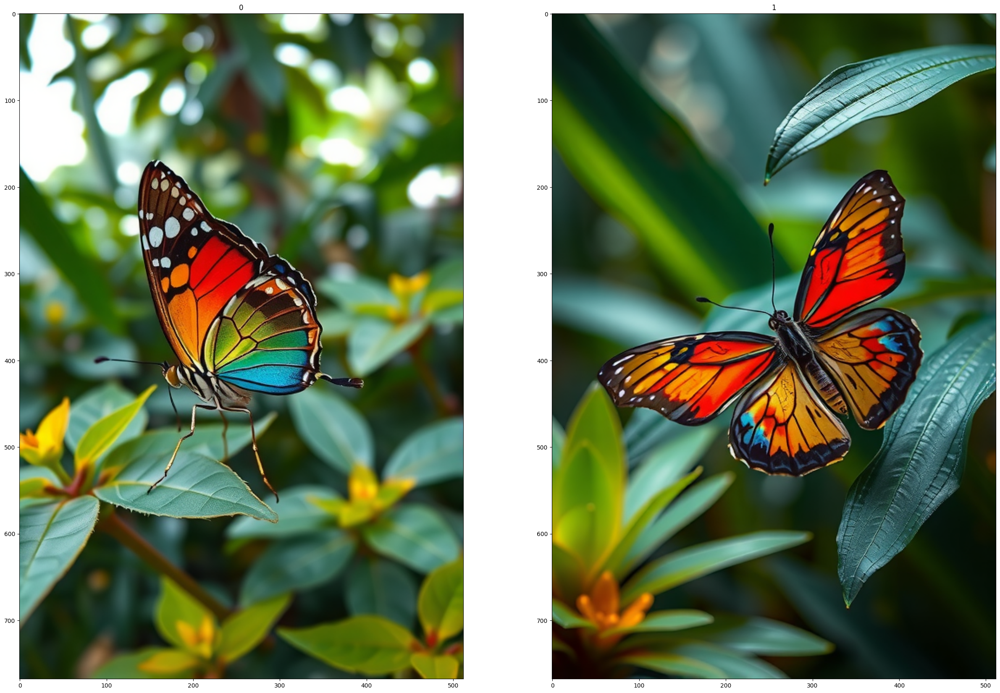

In [13]:
flux_gen.show_images(flux_gen.get_images_from_pipe_output(flux_outputs), 10)